In [3]:
#ジェネレーター実験
train_data_dir=r'C:\Users\icech\Desktop\lab2019\2019_4\Data\split_input'
batch_size=8
INPUT_SIZE=(128,128)
train_datagen = ImageDataGenerator(shear_range=0.2, zoom_range=0.2, horizontal_flip=True)

train_generator = train_datagen.flow_from_directory(train_data_dir,
                                                    target_size=INPUT_SIZE, batch_size=batch_size, class_mode=None)
# テストデータ作成をディレクトリ内のデータから随時作成するジェネレータ

def img_gen_concat(img_gen):
    for batch_img in img_gen:
        pass


Found 1344 images belonging to 4 classes.


In [5]:
a=next(train_generator)

In [1]:
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.python.keras.preprocessing.image import load_img, img_to_array, array_to_img, ImageDataGenerator
from PIL import Image

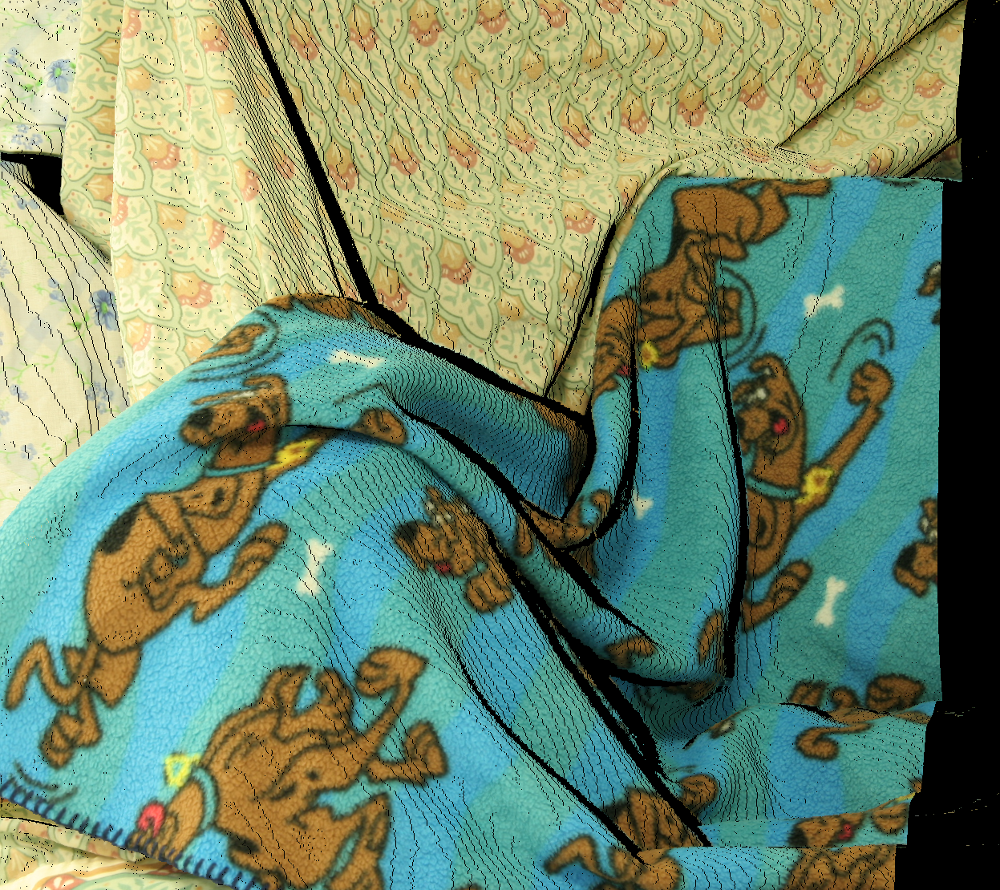

In [85]:
# aloe_ld=r'C:\Users\icech\Desktop\lab2019\2019_4\Data\Original\Aloe-2views\Aloe\disp1.png'
# aloe_lr=r'C:\Users\icech\Desktop\lab2019\2019_4\Data\Original\Aloe-2views\Aloe\view1.png'
aloe_ld=r'C:\Users\icech\Desktop\lab2019\2019_4\Data\Original\Cloth3\disp1.png'
aloe_lr=r'C:\Users\icech\Desktop\lab2019\2019_4\Data\Original\Cloth3\view1.png'
ld=load_img(aloe_ld, color_mode = "grayscale")
lr=load_img(aloe_lr)

r=img_to_array(lr).astype(np.int16)
d=img_to_array(ld).astype(np.int16)

#arangeを3次元行列に展開した
X=np.zeros(r.shape).astype(np.int16)
value=np.arange(0,r.shape[1]).astype(np.int16)
#valueにNoneで新しい次元を作成している
X[:,:,:]=value[None,:,None]
#3次元行列を2次元行列にしている。
d=d[:,:,0]

#写像先指定行列の作成
right_map=np.zeros(d.shape)
right_map[:,:]=np.arange(0,d.shape[1])-d
right_map=right_map.astype(np.int16)
right_map

#写像もとに存在しない端っこは消す
right_map=np.where(right_map< 0,0,right_map)

#shape[1]->X,shape[0]->Y
#写像先指定行列をもとに、右目視差画像を作成
right=np.zeros((d.shape[0],max(np.ravel(right_map))+1,3))
for y in range(right_map.shape[0]):
        right[y,right_map[y,:],:]=r[y,:,:]

array_to_img(right)

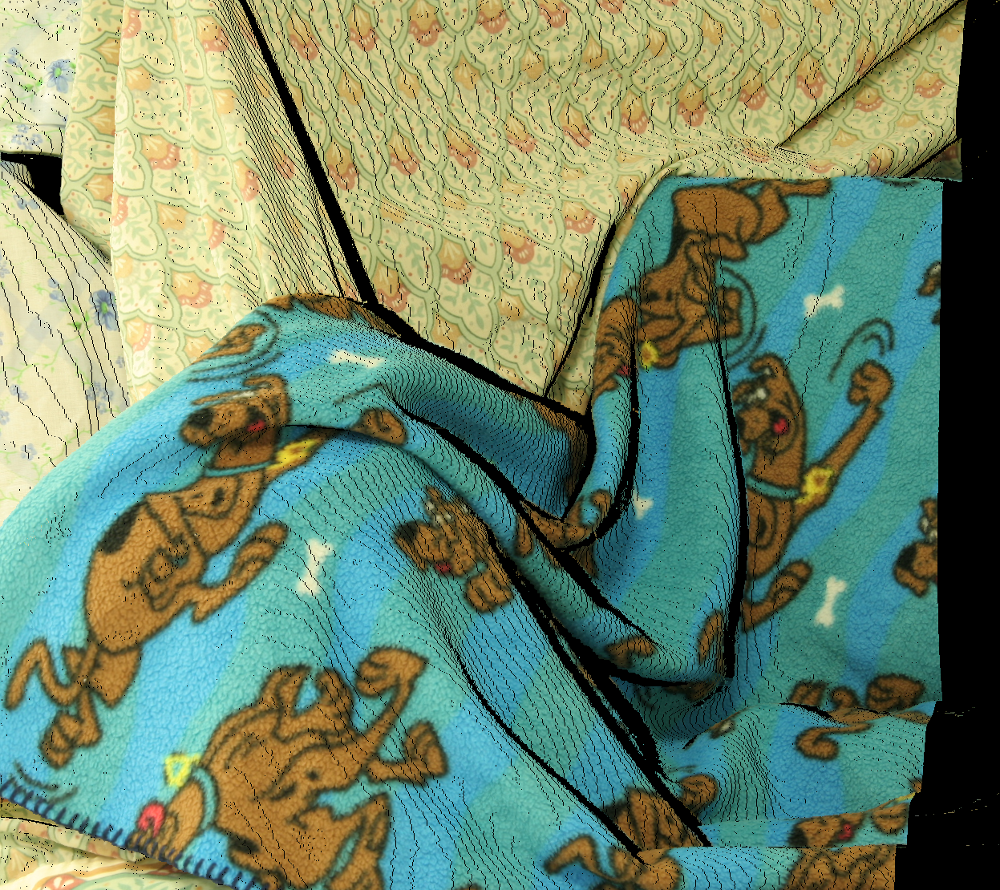

In [34]:
array_to_img(right)

In [40]:
r.shape

(1110, 1252, 3)

In [ ]:
#右->左の生成

In [46]:
d.shape[1]

1252

In [53]:
d.shape

(1110, 1252)

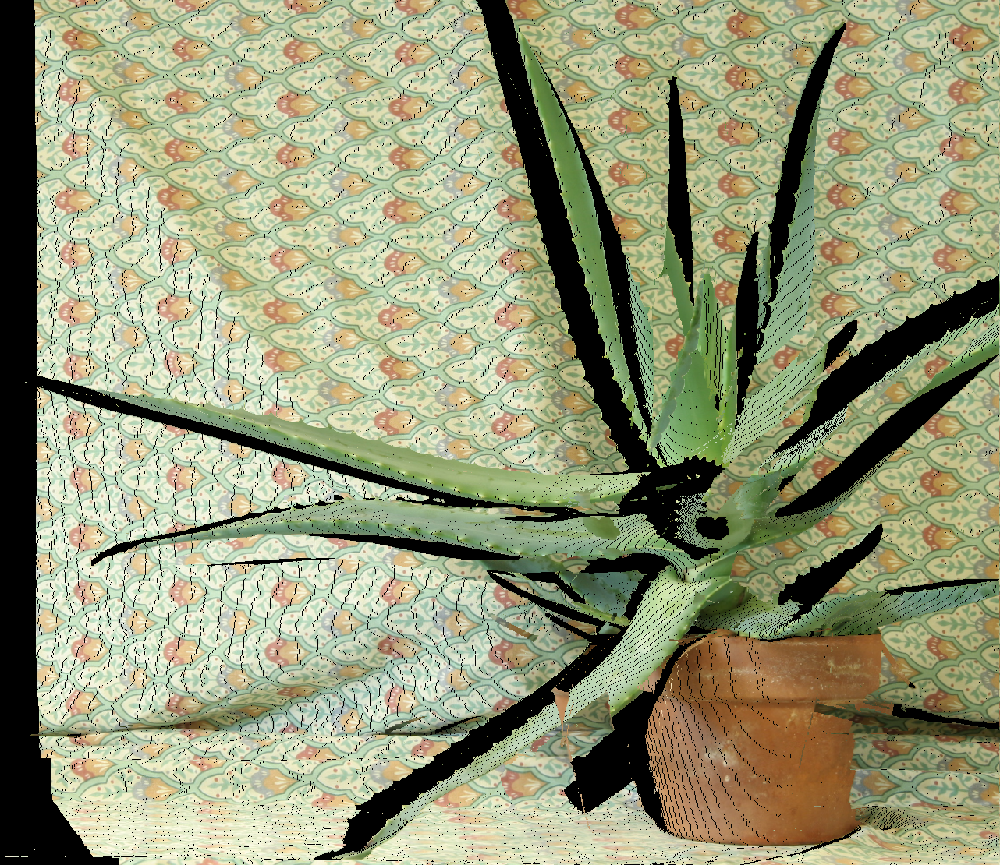

In [92]:
#右から左画像を作成
# aloe_ld=r'C:\Users\icech\Desktop\lab2019\2019_4\Data\Original\Aloe-2views\Aloe\disp1.png'
# aloe_lr=r'C:\Users\icech\Desktop\lab2019\2019_4\Data\Original\Aloe-2views\Aloe\view1.png'
aloe_ld=r'C:\Users\icech\Desktop\lab2019\2019_4\Data\Original\Aloe\disp5.png'
aloe_lr=r'C:\Users\icech\Desktop\lab2019\2019_4\Data\Original\Aloe\view5.png'
ld=load_img(aloe_ld, color_mode = "grayscale")
lr=load_img(aloe_lr)

r=img_to_array(lr).astype(np.int16)
d=img_to_array(ld).astype(np.int16)

#arangeを3次元行列に展開した
X=np.zeros(r.shape).astype(np.int16)
value=np.arange(0,r.shape[1]).astype(np.int16)
#valueにNoneで新しい次元を作成している
X[:,:,:]=value[None,:,None]
#3次元行列を2次元行列にしている。
d=d[:,:,0]

#写像先指定行列の作成
right_map=np.zeros(d.shape)
right_map[:,:]=np.arange(0,d.shape[1])+d
right_map=right_map.astype(np.int16)

#写像もとに存在しない端っこは消す
right_map=np.where(right_map>= d.shape[1],d.shape[1]-1,right_map)

#shape[1]->X,shape[0]->Y
#写像先指定行列をもとに、右目視差画像を作成
right=np.zeros((d.shape[0],d.shape[1],3))
for y in range(right_map.shape[0]):
    right[y,right_map[y,:],:]=r[y,:,:]

array_to_img(right)
#rightだけどleft

In [65]:
right_map.shape

(1110, 1252)

In [66]:
right.shape

(1110, 1252, 3)

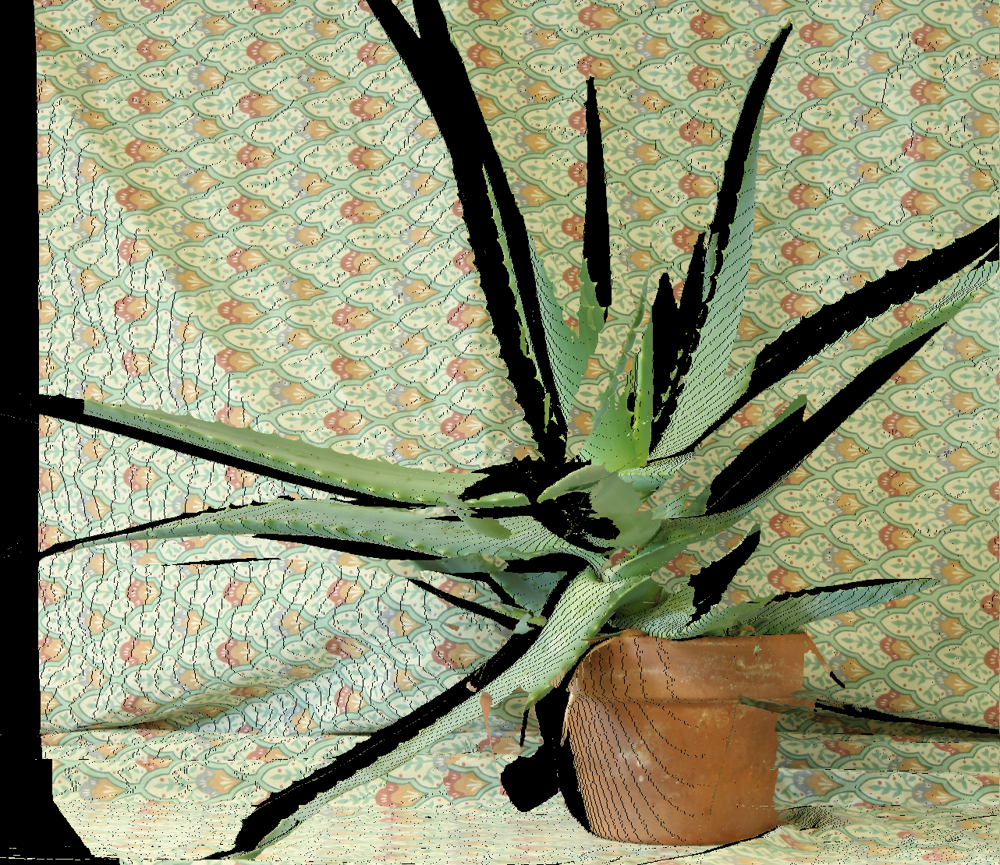

In [60]:
right_map[0,0]

44

In [22]:
dis_x=np.zeros(r.shape).astype(np.int16)

In [20]:
dis_x[:,d+]

array([[[ 173,  191,  147],
        [ 170,  188,  145],
        [ 172,  190,  147],
        ...,
        [1176, 1198, 1155],
        [1173, 1198, 1161],
        [1172, 1196, 1162]],

       [[ 173,  189,  133],
        [ 173,  188,  135],
        [ 179,  194,  142],
        ...,
        [1178, 1199, 1156],
        [1179, 1202, 1160],
        [1181, 1203, 1164]],

       [[ 145,  156,  106],
        [ 146,  157,  107],
        [ 150,  161,  108],
        ...,
        [1180, 1198, 1155],
        [1180, 1202, 1160],
        [1183, 1206, 1165]],

       ...,

       [[ 248,  244,  209],
        [ 246,  242,  206],
        [ 230,  231,  192],
        ...,
        [1259, 1257, 1219],
        [1261, 1258, 1219],
        [1258, 1255, 1215]],

       [[ 245,  235,  200],
        [ 238,  234,  197],
        [ 190,  200,  163],
        ...,
        [1258, 1256, 1223],
        [1263, 1258, 1224],
        [1259, 1258, 1223]],

       [[ 218,  206,  176],
        [ 202,  199,  168],
        [ 189,  

In [58]:
lr_a[0,:,:].shape

(1024,)

In [67]:
#0行目のR
width=range(0,ld_a.shape[0])
zero_r=ld_a[0,:,0]
#置換
zero_r=np.where(zero_r == 0, -9999, zero_r)
new_place=width+zero_r


In [69]:
new_place

array([  44.,   45.,   46., ..., 1068., 1068., 1069.])

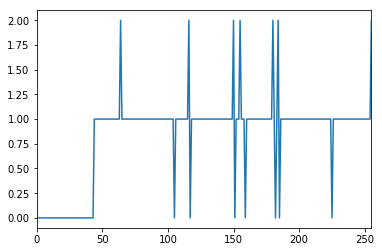

In [41]:
ld_a.shape

(1024, 1024, 1)

In [43]:
ld_a

array([[[ 44.],
        [ 44.],
        [ 44.],
        ...,
        [ 47.],
        [ 46.],
        [ 46.]],

       [[ 44.],
        [ 44.],
        [ 44.],
        ...,
        [ 47.],
        [ 47.],
        [ 46.]],

       [[ 44.],
        [ 44.],
        [ 44.],
        ...,
        [ 47.],
        [ 46.],
        [ 46.]],

       ...,

       [[152.],
        [152.],
        [153.],
        ...,
        [127.],
        [127.],
        [128.]],

       [[153.],
        [153.],
        [153.],
        ...,
        [128.],
        [128.],
        [128.]],

       [[153.],
        [153.],
        [153.],
        ...,
        [128.],
        [128.],
        [128.]]], dtype=float32)

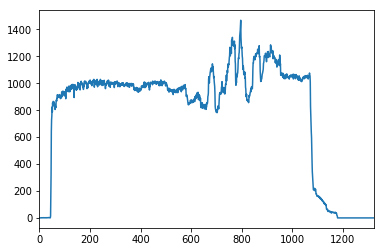

In [18]:
#bins,range,
hist, bins = np.histogram(right_map.ravel(),1324,[0,1324])
plt.xlim(0,1324)
plt.plot(hist)

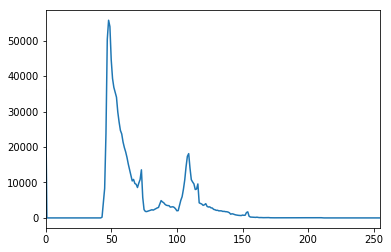

In [46]:
#bins,range,
hist, bins = np.histogram(ld_a.ravel(),256,[0,256])
plt.xlim(0, 255)
plt.plot(hist)

In [45]:
ld_a.ravel()

array([ 44.,  44.,  44., ..., 128., 128., 128.], dtype=float32)

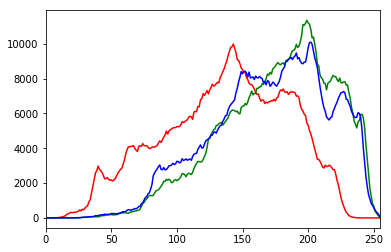

In [47]:
b, g, r = lr_a[:,:,0], lr_a[:,:,1], lr_a[:,:,2]

hist_r, bins = np.histogram(r.ravel(),256,[0,256])
hist_g, bins = np.histogram(g.ravel(),256,[0,256])
hist_b, bins = np.histogram(b.ravel(),256,[0,256])


# グラフの作成
plt.xlim(0, 255)
plt.plot(hist_r, "-r", label="Red")
plt.plot(hist_g, "-g", label="Green")
plt.plot(hist_b, "-b", label="Blue")

In [72]:
import glob
disp1s=r'C:\Users\icech\Desktop\lab2019\2019_4\Data\Original\*'
import re
disp1s=glob.glob(disp1s)

a=[re.sub(r'.+\\','',x) for x in disp1s]
a


['Aloe',
 'Baby1',
 'Baby2',
 'Baby3',
 'Bowling1',
 'Bowling2',
 'Cloth1',
 'Cloth2',
 'Cloth3',
 'Cloth4',
 'Flowerpots',
 'Lampshade1',
 'Lampshade2',
 'Midd1',
 'Midd2',
 'Monopoly',
 'Plastic',
 'Rocks1',
 'Rocks2',
 'Wood1',
 'Wood2']

In [ ]:
C:\Users\icech\Desktop\lab2019\2019_4\Data\Original\Aloe